<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW5_boosting_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## **Домашняя работа 5: Бустинг и кластеризация**

### **Постановка задачи:**

В этой работы ваша задача подразделена на части:

*   В первой части вам предстоит реалищовать класс бустинга и сравнить его со встроенными классами популярных библиотек;
*   Во второй части вам предстоит применить алгоритмы кластеризации в задаче  разделения изображения на семантические компоненты;

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**

## **Часть 1: построение класса алгоритма бустинга**

**Количество баллов:** 7

Начнём с нужных библиотек и загрузки данных. Работать будем с датасетом из Kaggle и с синтетическим датасетом.

Данные c Kaggle связаны с телефонной рекламой португальского банковского учреждения. Цель классификации — спрогнозировать, подпишется ли клиент на срочный депозит (переменная y).

Всего в данных 20 признаков, ознакомиться с признаковым описанием можно [здесь](https://www.kaggle.com/code/sachinrajput17/subscription-prediction-for-bank-marketing-data).

Будем действовать из предположений, что датасет достаточно хорош, чтобы мы уже могли построить на нём базовую модель.

In [60]:
import numpy as np
import pandas as pd
import plotly.express as px

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier

In [62]:
!wget  -O 'bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [63]:
df = pd.read_csv('bank_data.csv')
df.sample(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
4458,32,services,married,high.school,no,no,no,telephone,jun,wed,...,2,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1,-1
289,62,management,divorced,high.school,no,no,no,cellular,aug,mon,...,1,999,0,nonexistent,-2.9,92.201,-31.4,0.861,5076.2,1
1611,28,admin.,married,high.school,no,no,no,cellular,may,wed,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.281,5099.1,-1
2544,46,technician,divorced,professional.course,no,no,no,cellular,jul,tue,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,-1
7766,29,blue-collar,married,basic.6y,no,no,no,cellular,apr,mon,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.405,5099.1,-1


Разделим на train и test (random_state не меняем)

In [67]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Генерируем синтетические данные (seed не меняем)

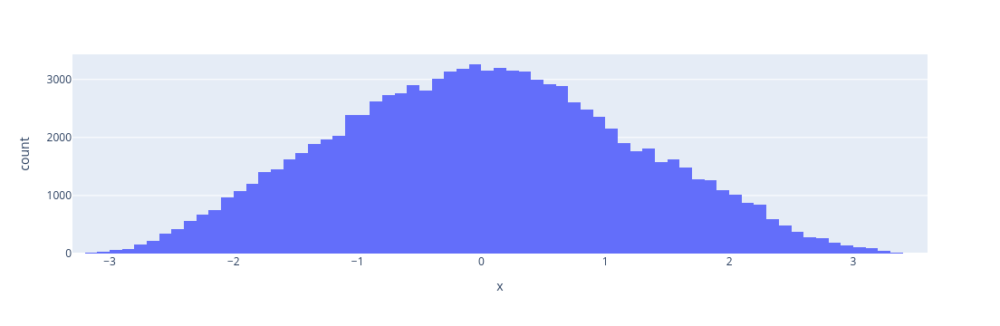

In [70]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [73]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''

    mask = np.random.choice([True, False], size=features.shape[0],
                            p=[examples_density, 1.0 - examples_density])
    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps

    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)

    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)
    if mode == 'classification':
        predicts = model.predict_proba(grid)[:, 1].reshape(steps, steps)
        values = (targets[mask] == 1).astype(np.float)
    elif mode == 'regression':
        predicts = model.predict(grid).reshape(steps, steps)
        values = targets[mask]
    else:
        raise ValueError('Unknown mode')

    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()

    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

### **Задание 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации**

Реализовывать класс буситнга необходимо согласно его теоретическому описанию. Вы начинаете с параметрами:

- `base_model_class=DecisionTreeRegressor` — базовая модель
- `base_model_params: dict={'max_features': 0.1}` — параметрмы базовой модели, рассчет максимального количества признаков полагаем как: `max(1, int(max_features * n_features_in_))`
- `n_estimators: int=10` — количество моделей
- `learning_rate: float=0.1` — скорость обучения
- `subsample: float=0.3` — доля данных, которая будет использоваться для подбора отдельных алгоритмов.
— `random_seed: int=228` — тут как всегда
– `custom_loss: list or tuple=None` — функция потерь
— `use_best_model: bool=False` — использовать ли при вызове predict и predict_proba лучшее с точки зрения валидационной выборки число деревьев в композиции
— `n_iter_early_stopping: int=None` — ранний критерий остановки

**Примечание:**

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже).

**Примечание 2:**

Нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [75]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


class Boosting:

    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params: dict={'max_features': 0.1},
        n_estimators: int=10,
        learning_rate: float=0.1,
        subsample: float=0.3,
        random_seed: int=228,
        custom_loss: list or tuple=None,
        use_best_model: bool=False,
        n_iter_early_stopping: int=None
    ):

        # Класс базовой модели
        self.base_model_class = base_model_class
        # Параметры для инициализации базовой модели
        self.base_model_params = base_model_params
        # Число базовых моделей
        self.n_estimators = n_estimators
        # Длина шага (которая в лекциях обозначалась через eta)
        self.learning_rate = learning_rate
        # Доля объектов, на которых обучается каждая базовая модель
        self.subsample = subsample
        # seed для бутстрапа, если хотим воспроизводимость модели
        self.random_seed = random_seed
        # Использовать ли при вызове predict и predict_proba лучшее
        # с точки зрения валидационной выборки число деревьев в композиции
        self.use_best_model = use_best_model
        # число итераций, после которых при отсутствии улучшений на валидационной выборке обучение завершается
        self.n_iter_early_stopping = n_iter_early_stopping

        # Место для нулевой модели
        self.initial_model_pred = None

        # Список для хранения весов при моделях
        self.gammas = []

        # Создаем список базовых моделей
        self.models = [self.base_model_class(**self.base_model_params) for _ in range(self.n_estimators)]

        # Если используем свою функцию потерь, ее нужно передать как список из loss-a и его производной
        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.sigmoid = lambda z: 1 / (1 + np.exp(-z))
            self.loss_fn = lambda y, z: -np.log(self.sigmoid(y * z)).mean()
            self.loss_derivative = lambda y, z: -y * self.sigmoid(-y * z)


    def get_params(self, deep):
        return {
            "base_model_class": self.base_model_class,
            "base_model_params": self.base_model_params,
            "n_estimators": self.n_estimators,
            "learning_rate": self.learning_rate,
            "subsample":self.subsample,
            "random_seed":self.random_seed,
            "use_best_model":self.use_best_model,
            "n_iter_early_stopping":self.n_iter_early_stopping
        }

    
    def set_params(self, **params):
        for param, value in params.items():
            if param == "base_model_class":
                self.base_model_class = value
            elif param == "base_model_params":
                self.base_model_params = value
            elif param == "n_estimators":
                self.n_estimators = value
            elif param == "n_estimators":
                self.n_estimators = value
            elif param == "learning_rate":
                self.learning_rate = value
            elif param == "subsample":
                self.subsample = value
            elif param == "use_best_model":
                self.use_best_model = value
            elif param == "random_seed":
                self.random_seed = value
            elif param == "n_iter_early_stopping":
                self.n_iter_early_stopping = value
            else:
                raise ValueError(f"Invalid parameter '{param}'")
        return self

    
    def _fit_new_model(self, X: np.ndarray, y: np.ndarray or list, n_model: int):
        """
        Функция для обучения одной базовой модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :param n_model: номер модели, которую хотим обучить
        """

        # Ваш код здесь       
        X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=self.subsample)
        self.models[n_model].fit(X_train, y_train)


    def _fit_initial_model(self, X, y):
        """
        Функция для построения нулевой (простой) модели. Не забудьте взять логарифм, потому что сигмоида применяется
        уже к сумме предсказаний базовых моделей, а не к каждому предсказанию каждой модели по отдельности.
        Подойдёт константная модель, возвращающая самый популярный класс,
        но если хотите, можете сделать что-нибудь посложнее.
        """

        positive_class = y[y==1].sum()
      
        odds = positive_class / len(y)
        
        log_odds = np.log(odds)

        return log_odds
        
    


    


    def _find_optimal_gamma(self, y: np.ndarray or list, old_predictions: np.ndarray,
                            new_predictions: np.ndarray, boundaries: tuple or list=(0, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boudnaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss, optimal_gamma = self.loss_fn(y, old_predictions), 0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            predictions = old_predictions + gamma * new_predictions
            gamma_loss = self.loss_fn(y, predictions)
            if gamma_loss < loss:
                optimal_gamma = gamma
                loss = gamma_loss

        return optimal_gamma


    def fit(self, X, y, eval_set=None):
        """
        Функция для обучения всей модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :eval_set: кортеж (X_val, y_val) для контроля процесса обучения или None, если контроль не используется
        """
        if self.use_best_model or self.n_iter_early_stopping is not None:
            X, X_val, y, y_val = train_test_split(X, y, train_size=0.75)
            b_acc = 0
            b_trees = 0
            counter = 0
        
        
        # self.sigmoid    self.loss_fn      self.loss_derivative 
        # Ваш код здесь
        self.initial_model_pred = self._fit_initial_model(X, y)
        
        F = np.full(X.shape[0], self.initial_model_pred)
        
        #print('fitting')
        for t in range(self.n_estimators):
            #print(t)
            # вычисление градиентов
            gradient = self.loss_derivative(y, F)
            
                
            # обучение нового дерева
            self._fit_new_model(X, gradient, t)
            
            # вычисление оптимального веса дерева
            # new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
            pred = self.models[t].predict(X)
            new_predictions = [self.sigmoid(pred[i]) for i in range(len(y))]
            
            gamma = self._find_optimal_gamma(y, np.array(F), np.array(new_predictions))
            
            self.gammas.append(gamma)


            # обновление ансамбля
            F-= gamma*pred

            if self.n_iter_early_stopping is not None:
                preds = np.round(boosting.predict_proba(X_val, validation=t+1) > 0.5)
                curr = accuracy_score((y_val == 1), preds)
                if counter == 0:
                    counter+=1
                    b_acc = curr
                else:
                    if curr > b_acc:
                        counter = 1
                    else:
                        counter+=1
                    if counter == self.n_iter_early_stopping:
                        self.n_estimators = t+1
                        break
                        

        #print('end fitting')
        if self.use_best_model:
            # отберём лучшее с точки зрения валидационной выборки число деревьев в композиции
            best_acc = 0
            best_trees = 0

            for i in range(1, self.n_estimators + 1):
                preds = np.round(boosting.predict_proba(X_val, validation=i) > 0.5)
                curr = accuracy_score((y_val == 1), preds)
                if curr > best_acc:
                    best_acc = curr
                    best_tree = i
            
            self.n_estimators = best_tree
            



    def predict(self, X: np.ndarray):
        """
        Функция для предсказания классов обученной моделью бустинга
        :param X: матрица признаков
        """
        # Ваш код здесь
        return np.array([(lambda i: 1 if i >= 0.5 else 0)(i) for i in self.predict_proba(X)])

    def predict_proba(self, X: np.ndarray, validation = False):
        """
        Функция для предсказания вероятностей классов обученной моделью бустинга
        :param X: матрица признаков
        """
        # Ваш код здесь
        F = np.full(X.shape[0], self.initial_model_pred)
        if validation:
            number = validation
        else:
            number = self.n_estimators
        
        for t in range(number):
            pred = self.models[t].predict(X)
            F-=pred*self.gammas[t]
        return self.sigmoid(F)


    @property
    def feature_importances_(self):
        """
        Функция для вычисления важностей признаков.
        Вычисление должно проводиться после обучения модели
        и быть доступно атрибутом класса.
        """
        feature_importance = np.zeros(self.models[0].feature_importances_.shape[0])
        for tree in self.models:
            feature_importance += tree.feature_importances_
        
        feature_importance /= np.sum(feature_importance)
        return feature_importance


## **Тест для вашей имплементации.**

Если класс написан правильно, две следующие ячейки должна отработать без ошибок и относительно быстро (у автора задания 2 и 0.2 секунд соответственно, accuracy 0.911 и 0.879 соответственно). Если у вас получилось качество выше указанного — отлично!

Ниже прогоняю 2 варианта:
1) n_iter_early_stopping = 7, use_best_model = True
2) n_iter_early_stopping = None, use_best_model = False

In [97]:
%%time

boosting = Boosting(n_iter_early_stopping = 7, use_best_model = True)
boosting.fit(X_train_synthetic, y_train_synthetic)

# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.911
CPU times: user 2.84 s, sys: 0 ns, total: 2.84 s
Wall time: 2.83 s


In [1092]:
%%time

boosting = Boosting()
boosting.fit(X_train_synthetic, y_train_synthetic)

# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.9062
CPU times: user 4.78 s, sys: 7.96 ms, total: 4.79 s
Wall time: 4.8 s


In [135]:
%%time

boosting = Boosting(use_best_model = True)
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)) > 0.87)

True
CPU times: user 327 ms, sys: 0 ns, total: 327 ms
Wall time: 337 ms


In [137]:
accuracy_score((df_test.y.values == 1), np.round(preds))

0.8733836206896551

In [1084]:
%%time

boosting = Boosting()
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)) > 0.87)

True
CPU times: user 423 ms, sys: 15 μs, total: 423 ms
Wall time: 430 ms


In [1086]:
accuracy_score((df_test.y.values == 1), np.round(preds)) 

0.8706896551724138

### **Задание 2. (1.2 балла) Сравнение с базовыми моделями**

- Сравните результаты вашей имплементации бустинга, где в качестве базовых моделей используйте алгоритмы, перечисленные ниже. Сравнение проводите на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. Данные берите из реальной задачи (bank_data).
- Ответьте на поставленные вопросы

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

In [44]:
# Ваш код здесь
answer = pd.DataFrame(index = ['сгенерированный датасет', 'bank_data'], \
                      columns=['DecisionTree (глубина 6)', 'RandomForest (50 деревьев)', 'LinearRegression'])


#### Решающее дерево глубины 6

In [117]:
%%time

boosting = Boosting(base_model_params={'max_features': 0.1, 'max_depth':6})
boosting.fit(X_train_synthetic, y_train_synthetic)

# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.91635
CPU times: user 3.12 s, sys: 27.9 ms, total: 3.15 s
Wall time: 3.15 s


In [54]:
answer.iloc[0, 0]=0.9166

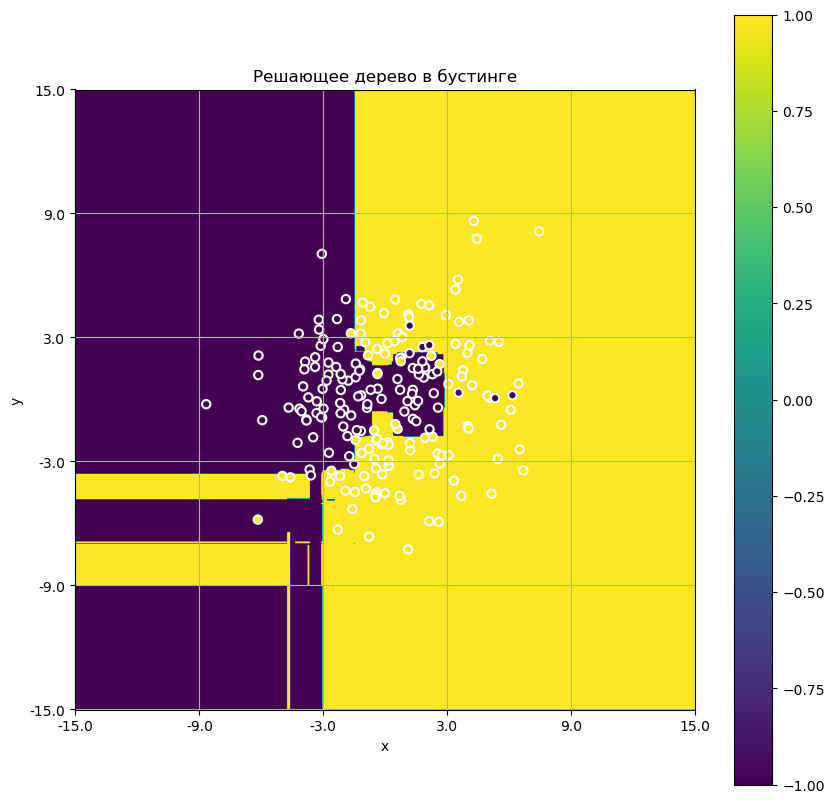

In [119]:
plot_predicts(boosting, features=X_test_synthetic, targets=y_test_synthetic, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='Решающее дерево в бустинге', mode='regression')

In [1106]:
%%time

boosting = Boosting(base_model_params={'max_features': 0.1, 'max_depth':6})
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8663793103448276
CPU times: user 505 ms, sys: 11.9 ms, total: 517 ms
Wall time: 529 ms


In [52]:
answer.iloc[1, 0]=0.8663793103448276

#### Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)

In [107]:
%%time

boosting = Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators':50})
boosting.fit(X_train_synthetic, y_train_synthetic)

# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.9144
CPU times: user 1min 7s, sys: 39 ms, total: 1min 7s
Wall time: 1min 7s


In [56]:
answer.iloc[0, 1] = 0.91545

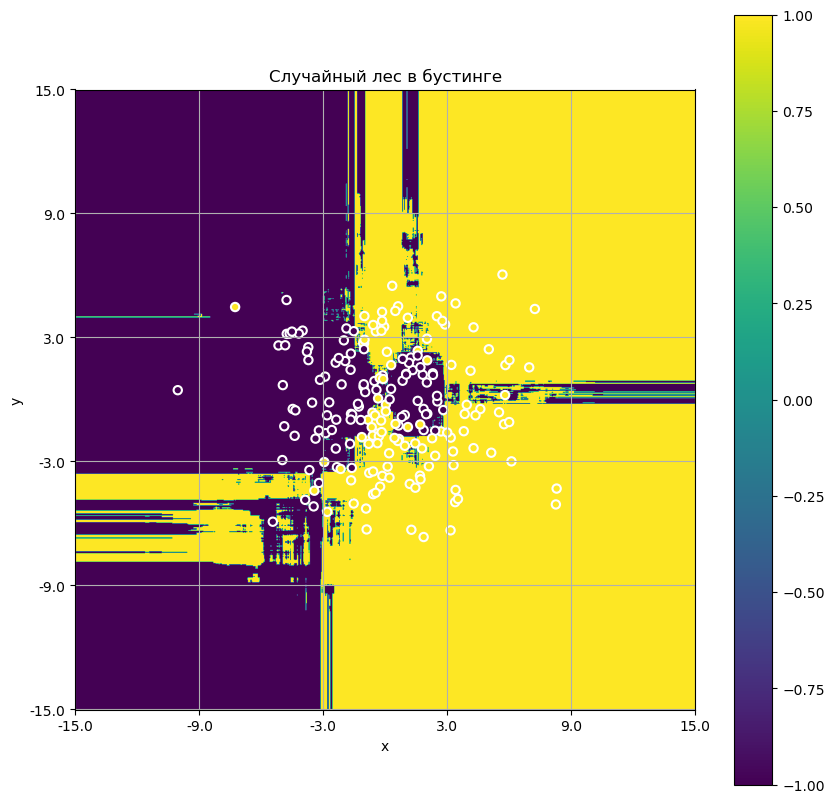

In [109]:
plot_predicts(boosting, features=X_test_synthetic, targets=y_test_synthetic, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='Случайный лес в бустинге', mode='regression')

In [28]:
%%time

boosting = Boosting(base_model_class=RandomForestRegressor, base_model_params={'n_estimators':50})
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8933189655172413
CPU times: user 7.29 s, sys: 28 ms, total: 7.32 s
Wall time: 7.32 s


In [58]:
answer.iloc[1, 1] = 0.8933189655172413

#### Линейная регрессия

In [111]:
%%time

from sklearn.linear_model import LinearRegression

boosting = Boosting(base_model_class=LinearRegression, base_model_params={})
boosting.fit(X_train_synthetic, y_train_synthetic)

# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.6721
CPU times: user 4.4 s, sys: 272 ms, total: 4.67 s
Wall time: 2.93 s


In [62]:
answer.iloc[0, 2] = 0.6733

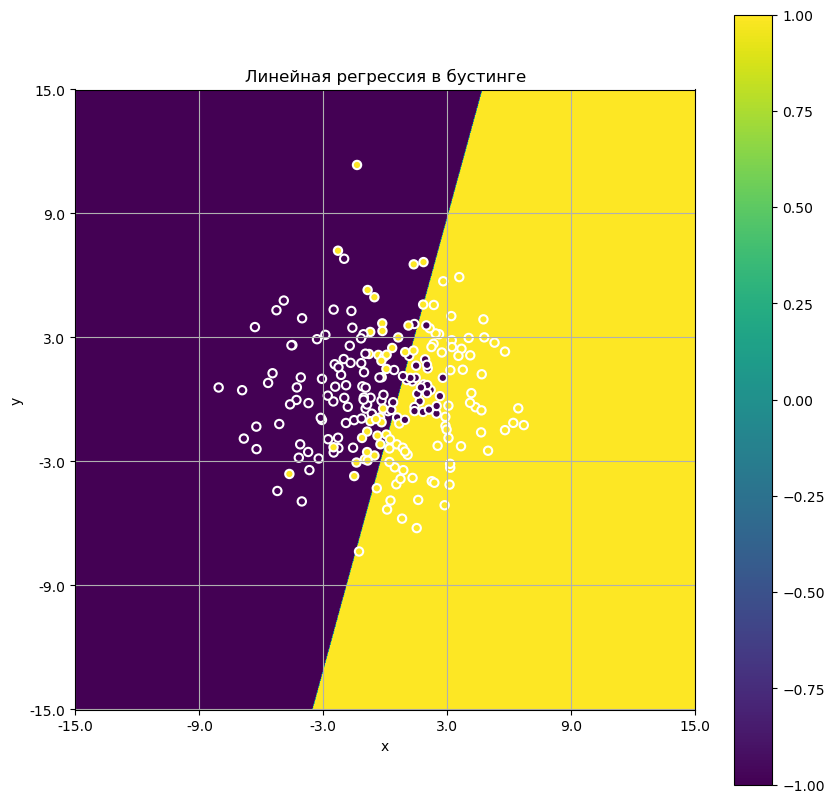

In [113]:
plot_predicts(boosting, features=X_test_synthetic, targets=y_test_synthetic, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='Линейная регрессия в бустинге', mode='regression')

In [36]:
%%time

boosting = Boosting(base_model_class=LinearRegression, base_model_params={})
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8216594827586207
CPU times: user 820 ms, sys: 84 ms, total: 904 ms
Wall time: 475 ms


In [66]:
answer.iloc[1, 2] = 0.8216594827586207


In [87]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(max_iter=10000)


model.fit(X_train_synthetic, y_train_synthetic)

preds = np.round(model.predict_proba(X_test_synthetic)[:,1] > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.68905


In [89]:
model = LogisticRegression(max_iter=10000)


model.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)



preds = np.round(model.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8550646551724138


In [91]:
answer['Одна модель LogisticRegression без бустинга'] = [0.68905, 0.8550646551724138]
answer

,DecisionTree (глубина 6),RandomForest (50 деревьев),LinearRegression,Одна модель LogisticRegression без бустинга
сгенерированный датасет,0.9166,0.91545,0.6733,0.689050
bank_data,0.866379,0.893319,0.821659,0.855065


**Вопросы:**

1) Какая из моделей имеет оптимальное качество? С чем это связано?

2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

4) Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

**Ваш ответ здесь**

1. Какая из моделей имеет оптимальное качество? С чем это связано?

Модель с имплементацией случайного леса имеет оптимальное качество (0.91 и 0.89).
Это связано с тем, что случайный лес:
- уменьшает корреляции между базовыми моделями (каждое дерево обучается на случайной подвыборке данных и с использованием случайного подмножества признаков, это делает деревья более разнообразными и менее склонными к совершению одних и тех же ошибок;
- обладает хорошей обобщающей способностью, устойчив к переобучению благодаря случайному выбору признаков и образцов;
- смягчает влияния выбросов, поскольку каждое дерево обучается на случайной подвыборке данных, влияние отдельных выбросов уменьшается;
- обрабатывает нелинейности, каждое дерево в случайном лесу может захватывать сложные взаимодействия между признаками.

2. Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

Сильнее всего переобучается модель с имплементацией линейной регресии (0.67 и 0.82), так как линейная регрессия имеет ограниченную выразительность (моделирует только линейные зависимости) и недостаточную сложность, имеет высокое смещение (bias). Градиентный бустинг лишь усиливает недостатки линейной регрессии. Переобучении снизится при ранней остановке модели, так модель не будет сильно подстраиваться под обучающие данные и под шум в данных.



3. Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

Нет. Одна логистическая регрессия работает лучше (0.68, 0.85) VS (0.67 и 0.82), так как выше  мы показали, что бустинг только усиливает недостатки линейной регрессии и итоговый ансамбль сильно переобучается.


4. Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

Визуализация предсказаний бустинга с имплементацией линейной регрессии линейная, наблюдения разделены прямой линий. На графике видно, что ансамбль линейных моделей не может выучить нелинейные зависимости, модель сильно переобучена и делает много ошибок классификации.

Визуализация предсказаний бустинга с имплементацией решающего дерева ступенчатая, каждое дерево решений разделяет пространство признаков на регионы, и предсказание в каждом регионе постоянно, итоговый ансамбль представляет собой комбинацию ступенчатых функций, набор прямоугольных областей с разными значениями предсказаний. Ошибок классификации намного меньше, чем при использовании линейной регрессии.


Визуализация предсказаний бустинга с имплементацией случайного леса схожа с таковой для решающего дерева, но есть явные различия. Предсказания случайного леса более гладкие и менее подвержены резким переходам, чем предсказания решающего дерева, случайный лес усредняет предсказания нескольких деревьев, каждое из которых обучено на случайной подвыборке данных и с использованием случайного подмножества признаков. Этот процесс усреднения сглаживает отдельные неровности и уменьшает дисперсию.

### **Задание 3. (0.8 балла) Сравнение с бустингами**

- Сравните на реальных данных данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией.
- Укажите, получилось ли у вас победить библиотечные реализации на тестовых данных?

**Примечание:**

Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов.


In [26]:
# Ваш код здесь
from catboost import CatBoostClassifier, Pool, metrics, cv
from sklearn.model_selection import GridSearchCV
import numpy as np

parameters = {'n_estimators':[10, 20, 30, 40, 50],
              'depth'         :[4,5,6,10],
              'leaf_estimation_iterations':[10,11,15],
              'learning_rate' : [0.01, 0.03, 0.1],
             }


model_cat = CatBoostClassifier(eval_metric='Accuracy')


grid_search_cat = GridSearchCV(estimator=model_cat, param_grid=parameters, scoring='accuracy', cv=3)


grid_search_cat.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values, verbose=0)


print("Лучшие параметры CatBoost:", grid_search_cat.best_params_)
print("Лучшая оценка CatBoost:", grid_search_cat.best_score_)

Лучшие параметры CatBoost: {'depth': 10, 'leaf_estimation_iterations': 15, 'learning_rate': 0.1, 'n_estimators': 50}
Лучшая оценка CatBoost: 0.8891438230322629


In [28]:
best_model = CatBoostClassifier(**grid_search_cat.best_params_, eval_metric='Accuracy')
best_model.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values, verbose=0)

In [30]:
preds = np.round(best_model.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
print(accuracy_score((df_test.y.values == 1), np.round(preds)))

0.8911637931034483


In [ ]:
# число деревьев, длина шага, глубина дерева/число листьев

In [61]:
from tqdm import tqdm
from time import sleep

base_model_params = [{'max_depth':6, 'n_estimators':50, 'min_samples_split':2},{'max_depth':4, 'n_estimators':50}, {'max_depth':10, 'n_estimators':50},
                    {'max_depth':6, 'n_estimators':40}, {'max_depth':6, 'n_estimators':30}, {'max_depth':6, 'n_estimators':50, 'min_samples_split':10},
                    {'max_depth':6, 'n_estimators':50, 'min_samples_split':20}, {'max_depth': 10, 'n_estimators': 50, 'min_samples_split':2},
                    {'max_depth': 10, 'n_estimators': 50, 'min_samples_split':10}, {'max_depth': 10, 'n_estimators': 50, 'min_samples_split':20}]

best = 0
for i in tqdm(range(len(base_model_params))):
    print(base_model_params[i])
    boosting = Boosting(base_model_class=RandomForestRegressor, base_model_params=base_model_params[i])
    boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)

    preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

    acc = accuracy_score((df_test.y.values == 1), np.round(preds))
    print(f'accuracy_score на тесте: {acc}')
    if acc > best:
        best = acc
        best_param = base_model_params[i]
    #print(acc)
    print('\n\n')


print(f'\n\n\nBest accuracy score: {best}. Best params: {best_param}')
    
    

  0%|                                                    | 0/10 [00:00<?, ?it/s]

{'max_depth': 6, 'n_estimators': 50, 'min_samples_split': 2}


 10%|████▍                                       | 1/10 [00:02<00:23,  2.65s/it]

accuracy_score на тесте: 0.8863146551724138



{'max_depth': 4, 'n_estimators': 50}


 20%|████████▊                                   | 2/10 [00:04<00:18,  2.32s/it]

accuracy_score на тесте: 0.8766163793103449



{'max_depth': 10, 'n_estimators': 50}


 30%|█████████████▏                              | 3/10 [00:08<00:21,  3.07s/it]

accuracy_score на тесте: 0.8933189655172413



{'max_depth': 6, 'n_estimators': 40}


 40%|█████████████████▌                          | 4/10 [00:10<00:16,  2.76s/it]

accuracy_score на тесте: 0.8884698275862069



{'max_depth': 6, 'n_estimators': 30}


 50%|██████████████████████                      | 5/10 [00:12<00:11,  2.38s/it]

accuracy_score на тесте: 0.8884698275862069



{'max_depth': 6, 'n_estimators': 50, 'min_samples_split': 10}


 60%|██████████████████████████▍                 | 6/10 [00:15<00:09,  2.44s/it]

accuracy_score на тесте: 0.8879310344827587



{'max_depth': 6, 'n_estimators': 50, 'min_samples_split': 20}


 70%|██████████████████████████████▊             | 7/10 [00:17<00:07,  2.48s/it]

accuracy_score на тесте: 0.884698275862069



{'max_depth': 10, 'n_estimators': 50, 'min_samples_split': 2}


 80%|███████████████████████████████████▏        | 8/10 [00:21<00:05,  2.90s/it]

accuracy_score на тесте: 0.8911637931034483



{'max_depth': 10, 'n_estimators': 50, 'min_samples_split': 10}


 90%|███████████████████████████████████████▌    | 9/10 [00:25<00:03,  3.10s/it]

accuracy_score на тесте: 0.8890086206896551



{'max_depth': 10, 'n_estimators': 50, 'min_samples_split': 20}


100%|███████████████████████████████████████████| 10/10 [00:28<00:00,  2.87s/it]

accuracy_score на тесте: 0.8852370689655172






Best accuracy score: 0.8933189655172413. Best params: {'max_depth': 10, 'n_estimators': 50}


In [65]:
ans = pd.DataFrame(index = ['bank_data'], columns=['Catboost', 'Самописный градиентный бустинг с имплементацией случайного леса'])
ans.iloc[0, 0] = 0.8911637931034483
ans.iloc[0, 1] = 0.8933189655172413
ans

,Catboost,Самописный градиентный бустинг с имплементацией случайного леса
bank_data,0.891164,0.893319


Получилось победить библиотечные реализации на тестовых данных!

### **Задание 4. (1 балл) Капля теории**

Теоретически, мы могли бы построить бэггинг на логистических регрессиях. Оцените целесообразность такого подхода. В ответе укажите:

- Идею бэггинга и его свойства;
- Характеристики модели логистической регресии;
- Сопоставление и вывод.


**Ваш ответ здесь**

**Идея бэггинга и его свойства**
Это метод ансамблирования в машинном обучении, который направлен на улучшение стабильности и точности алгоритмов машинного обучения.
Идея работы:
1) Bootstrap Sampling (Выборка с возвратом). Из исходного обучающего набора данных случайным образом выбираются n подвыборок (bootstrap samples) с возвратом. Это означает, что один и тот же элемент данных может быть выбран несколько раз в одной подвыборке. Размер каждой подвыборки обычно равен размеру исходного набора данных.
2) Затем производится обучение базовых моделей (в нашем случае моделей логистической регрессии). На каждой из n подвыборок обучается отдельная модель логистической регрессии. Каждая модель будет немного отличаться из-за различий в обучающих данных.
3) Для предсказания на новых данных каждая из n обученных моделей выдает свое предсказание (вероятность принадлежности к классу). Эти предсказания агрегируются для получения финального предсказания. Для предсказания вероятности усредняются вероятности, предсказанные каждой моделью. Затем применяется порог (например, 0.5) для определения класса. Для предсказания метки класса используется мажоритарное голосование. Выбирается класс, который предсказан большинством моделей.

Преимущества бэггинга с логистической регрессией:
1) Уменьшение дисперсии. Бэггинг уменьшает дисперсию модели, делая ее более стабильной и менее склонной к переобучению. Это особенно полезно, когда у вас есть небольшая или зашумленная обучающая выборка.
2) Улучшение точности. В некоторых случаях бэггинг может улучшить точность предсказаний, особенно если базовые модели (логистические регрессии) имеют высокую дисперсию.
3) Бэггинг легко реализуется.
   
Недостатки бэггинга с логистической регрессией:
1) Обучение нескольких моделей логистической регрессии занимает больше времени, чем обучение одной модели.
2) Ансамбль моделей сложнее интерпретировать, чем отдельную модель логистической регрессии.
3) Бэггинг не всегда улучшает результаты. Если базовая модель уже достаточно стабильна и имеет низкую дисперсию, бэггинг может не дать существенного прироста в производительности.


**Характеристики модели логистической регресии**

При использовании логистической регрессии в качестве базовой модели в бэггинге, характеристики отдельных моделей логистической регрессии отличаются от характеристик обычной, отдельно обученной логистической регрессии. Это обусловлено тем, что каждая модель обучается на случайной подвыборке данных, что приводит к следующим изменениям в их характеристиках:
1) разнообразие весов. Каждая отдельная модель логистической регрессии может иметь немного более высокое смещение, чем отдельно обученная модель. Однако, за счет усреднения предсказаний нескольких моделей, общая дисперсия ансамбля значительно уменьшается. Бэггинг стремится сбалансировать смещение и дисперсию, что приводит к улучшению обобщающей способности модели.
2) Смещение (Bias) и Дисперсия (Variance). Каждая отдельная модель логистической регрессии может иметь немного более высокое смещение, чем отдельно обученная модель.
3) Чувствительность к выбросам уменьшается. Выбросы, присутствующие в одной подвыборке, могут не попасть в другие подвыборки, что снижает их влияние на общую производительность модели. Каждая модель логистической регрессии обучается на подвыборке данных, что уменьшает влияние отдельных выбросов на итоговое предсказание ансамбля.
5) Обобщающая способность улучшается за счет уменьшения дисперсии и усреднения предсказаний нескольких моделей. Бэггинг помогает модели лучше обобщать на новые данные, даже если отдельные модели имеют немного более высокое смещение.
6) Ансабмль логистических регрессий сложнее интерпретировать, чем простую модель логистической регрессии.
7) Ансамбль моделей имеет большую сложность по сравнению с одной моделью. Это требует больше вычислительных ресурсов для обучения и хранения, но в то же время позволяет модели улавливать более сложные закономерности в данных.



**Сопоставление и вывод**

Основное преимущество бэггинга — уменьшение дисперсии, что приводит к повышению стабильности и улучшению обобщающей способности модели.

Бэггинг с логистической регрессией лучше использовать в следующих случаях:
1) есть небольшая или зашумленная обучающая выборка;
2) модель логистической регрессии имеет высокую дисперсию;
3) если важна стабильность и устойчивость модели к небольшим изменениям в данных.


Бустинг (Gradient Boosting, XGBoost, LightGBM, CatBoost) лучше использовать:
1) для больших и сложных наборов данных с нелинейными зависимостями;
2) для задач, требующих высокой точности. Бустинг часто обеспечивает более высокую точность, чем бэггинг, за счет итеративного обучения и исправления ошибок предыдущих моделей;
3) когда не важна интерпретируемость. Бустинг сложнее интерпретировать, чем бэггинг, поэтому он лучше подходит для задач, где точность важнее понимания логики работы модели.
4) для задач с категориальными признаками (CatBoost и LightGBM особенно хорошо работают с категориальными признаками).

## **Часть 2: Разделение изображения на семантические компоненты**

**Количество баллов:** 3

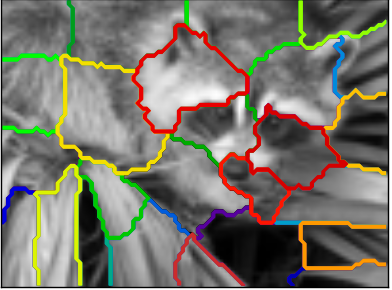

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации.

Проверим их на ```duck.jpg``` и ```owls.jpg```

### **Задание 5 (0.2 балла)**

Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

In [4]:
from skimage import io
from PIL import Image, ImageDraw
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

duck = io.imread('duck.jpg')
owls = io.imread('owls.jpg')

plt.figure(figsize=(10, 6))

duck.shape

(700, 933, 3)

<Figure size 1000x600 with 0 Axes>

In [5]:
owls.shape

(1271, 1920, 3)

In [8]:
owls[0,0,:] # RGB для точки (0, 0)

array([217, 204,  14], dtype=uint8)

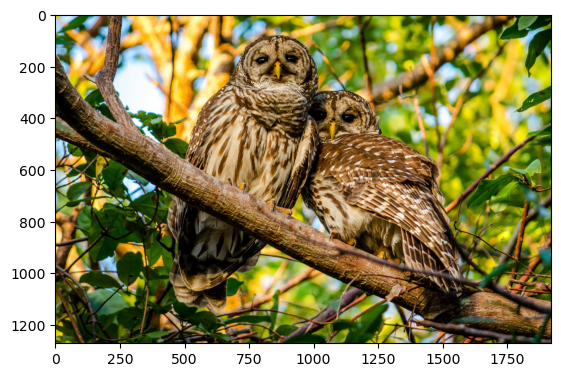

In [149]:
plt.imshow(owls)

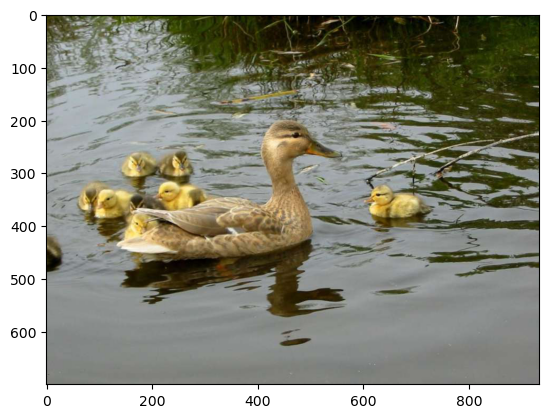

In [151]:
plt.imshow(duck)

### **Задание 6 (0.8 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

- Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :))
- Проанализируйте результат

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [29]:
from PIL import Image, ImageDraw
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [159]:
owls.shape

(1271, 1920, 3)

In [31]:
def find_components(image, lmbd, n_clusters):
    # Ваш код здесь
    """
    Запишем все пиксели в векторы размерности 5.
    Х: каждая строка суть пиксель изображения (lmbd*i, lmbd*j, R, G, B, )
    i, j - координаты пикселя на плоскости
    lmbd - параметр, выражающий важность пространственной связности перед цветовой похожестью
    """
    height, width, colors = image.shape

    X = np.zeros((height * width, colors + 2))

    for i in range(height):
        for j in range(width):
            X[i * width + j] = [lmbd * i, lmbd * j] + list(image[i, j])

    k_means = KMeans(n_clusters=n_clusters, n_init="auto")
    k_means.fit(X)

    labels = k_means.labels_

    segmented_img = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            segmented_img[i, j] = k_means.cluster_centers_[labels[i * width + j], 2:]     # усредняем цвет

    return segmented_img
    

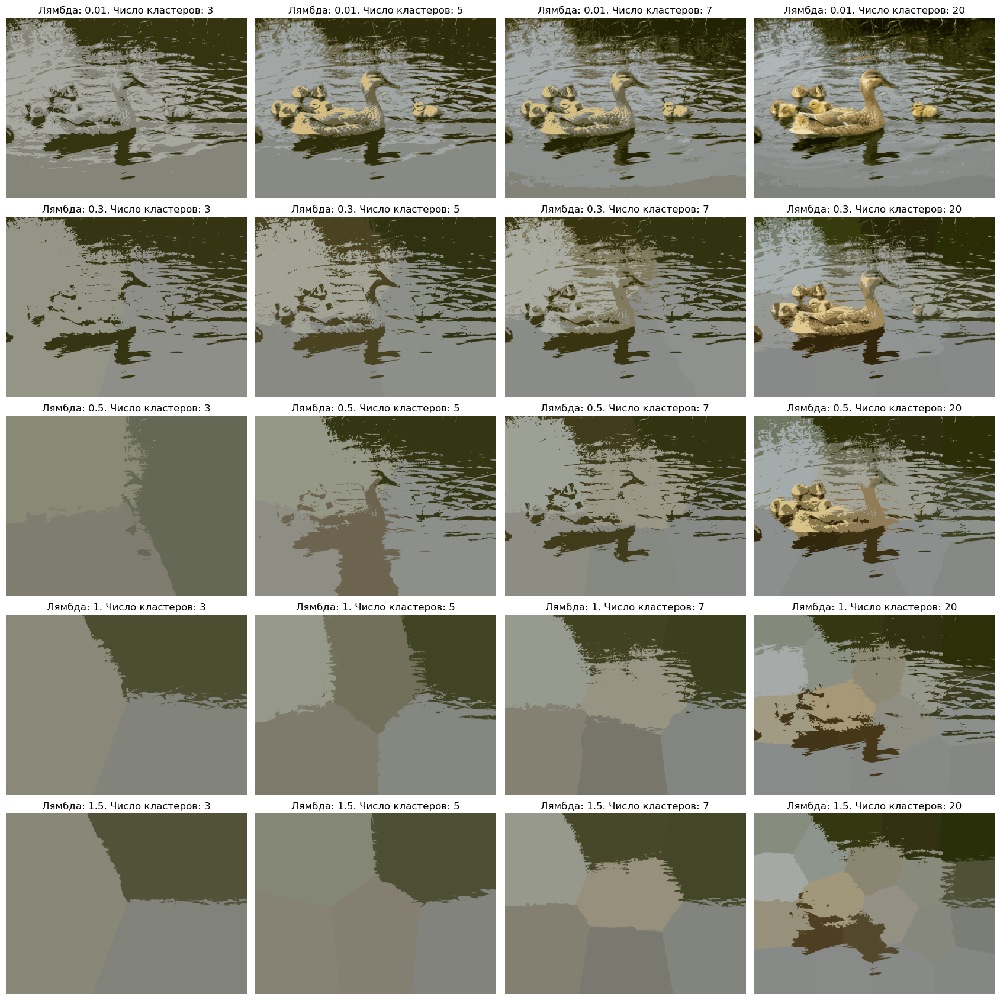

In [195]:
lmbd_values = [0.01, 0.3, 0.5, 1, 1.5]
n_clusters = [3, 5, 7, 20]

plt.figure(figsize=(17, 17))

s = 1
for lmbd in lmbd_values:
    for n in n_clusters:
        segmented_img = find_components(duck, lmbd, n)

        plt.subplot(len(lmbd_values), len(n_clusters), s)
        plt.imshow(segmented_img)
        plt.title(f"Лямбда: {lmbd}. Число кластеров: {n}")
        plt.axis("off")

        s += 1


plt.tight_layout()
plt.show()

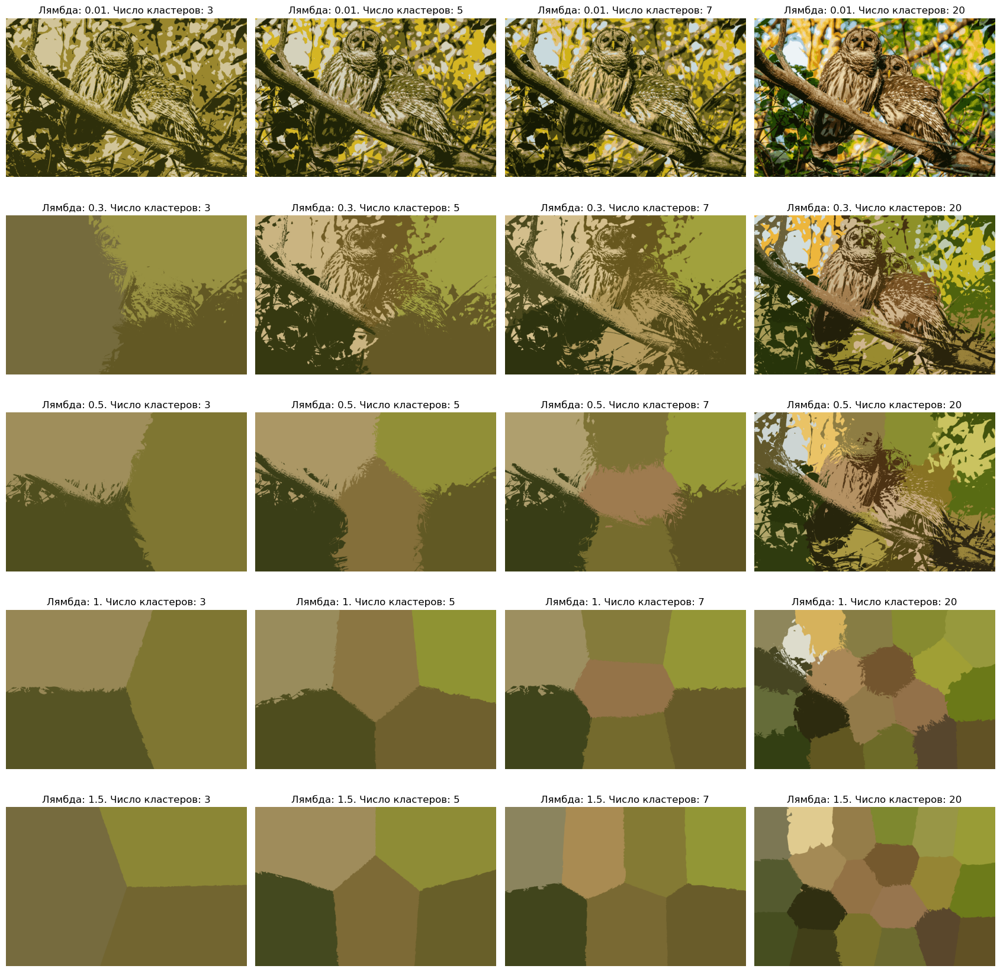

In [200]:
lmbd_values = [0.01, 0.3, 0.5, 1, 1.5]
n_clusters = [3, 5, 7, 20]

plt.figure(figsize=(17, 17))

s = 1
for lmbd in lmbd_values:
    for n in n_clusters:
        segmented_img = find_components(owls, lmbd, n)

        plt.subplot(len(lmbd_values), len(n_clusters), s)
        plt.imshow(segmented_img)
        plt.title(f"Лямбда: {lmbd}. Число кластеров: {n}")
        plt.axis("off")

        s += 1


plt.tight_layout()
plt.show()

**Ваш ответ здесь**

При росте лямбда мы повышаем важность координат. В этом случае важность цветов Red, Green, Blue падает и кластеризация производится географически, разделением плоскости на примерно равные части (кластеры).
При малых значениях лямбда понижается важность координат и кластеризация производится по цветам.

### **Задание 7 (0.8 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [10]:
from skimage import color, transform
from sklearn.cluster import spectral_clustering
from sklearn.feature_extraction.image import img_to_graph


def spectral_segmentation(image, n_clusters, beta, eps):
    #your code here
    gray_image = color.rgb2gray(image)
    resized_image = transform.resize(gray_image, (gray_image.shape[0] // 2, gray_image.shape[1] // 2))

    graph = img_to_graph(resized_image)
    graph.data = np.exp(-beta * graph.data / resized_image.std()) + eps

    labels = spectral_clustering(
        graph,
        n_clusters=n_clusters,
        assign_labels="kmeans",
    )

    labels = labels.reshape(resized_image.shape)

    return labels, resized_image

### **Задание 8 (0.2 балла)**
- Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.
- Проанализируйте сравнение

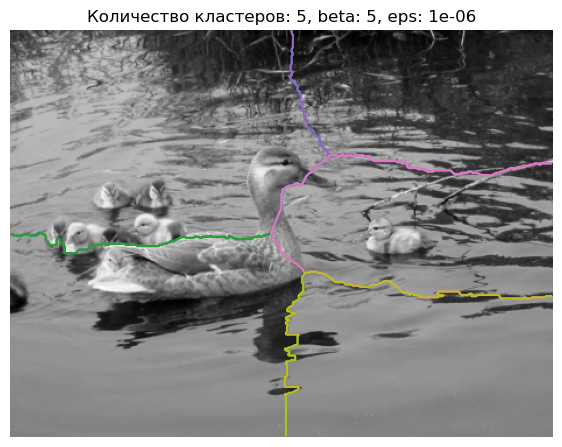

In [13]:
# Ваш код здесь
img = duck
n_clusters = 5
beta = 5 
eps = 1e-6


labels, resized_image = spectral_segmentation(img, n_clusters, beta, eps)

plt.figure(figsize=(7, 7))
plt.imshow(resized_image, cmap=plt.cm.gray)

for l in range(n_clusters):
    plt.contour(labels == l, colors=[plt.cm.tab10(l / float(n_clusters)),])

plt.title(f"Количество кластеров: {n_clusters}, beta: {beta}, eps: {eps}")
plt.axis("off")
plt.show()

In [43]:
from skimage import color, transform
from sklearn.cluster import spectral_clustering
from sklearn.feature_extraction.image import img_to_graph


def spectral_segmentation(image, n_clusters, beta, eps):
    #your code here
    gray_image = color.rgb2gray(image)
    resized_image = transform.resize(gray_image, (gray_image.shape[0] // 4, gray_image.shape[1] // 4))

    graph = img_to_graph(resized_image)
    graph.data = np.exp(-beta * graph.data / resized_image.std()) + eps

    labels = spectral_clustering(
        graph,
        n_clusters=n_clusters,
        assign_labels="kmeans",
    )

    labels = labels.reshape(resized_image.shape)

    return labels, resized_image

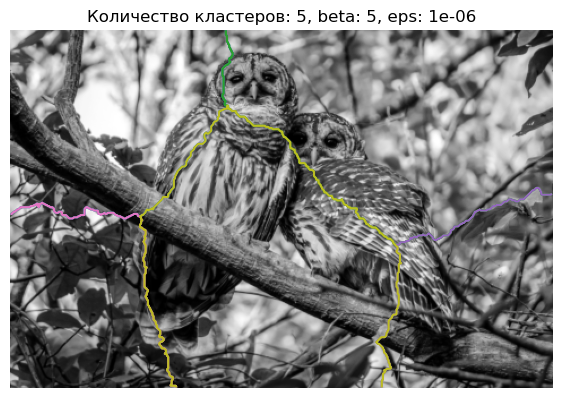

In [45]:
img = owls
n_clusters = 5
beta = 5 
eps = 1e-6


labels, resized_image = spectral_segmentation(img, n_clusters, beta, eps)

plt.figure(figsize=(7, 7))
plt.imshow(resized_image, cmap=plt.cm.gray)

for l in range(n_clusters):
    plt.contour(labels == l, colors=[plt.cm.tab10(l / float(n_clusters)),])

plt.title(f"Количество кластеров: {n_clusters}, beta: {beta}, eps: {eps}")
plt.axis("off")
plt.show()

**Ваш ответ здесь**

KMeans прост в реализации и быстр в работе, но не справляется с кластерами сложной формы, не учитывает пространственные отношения между пикселями, что может приводит к появлению шумных сегментов.

Спектральная кластеризация хорошо справляется с кластерами сложной формы, которые KMeans не может обнаружить. Спектральная кластеризация ощутимо вычислительно затратнее, чем KMeans.

### **Задание 9 (1 балл)**

- Найдите интересную картинку милого животного и примените алгоритмы и к ней. Поэкспериментируйте с параметрами алгоритмов и постарайтесь добиться оптимального результата. Картинку нужно будет загрузить вместе с работой.

- Сравните два подхода и сегментации, к которым они приводят. Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

**Примечание:**

Слишком большие лучше не брать - считаться будет долго. Не забудьте визуализировать!


In [25]:
# Ваш код здесь
from skimage import io
from PIL import Image, ImageDraw
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

animal = io.imread('animal.jpeg')

plt.figure(figsize=(10, 6))

animal.shape

(630, 1120, 3)

<Figure size 1000x600 with 0 Axes>

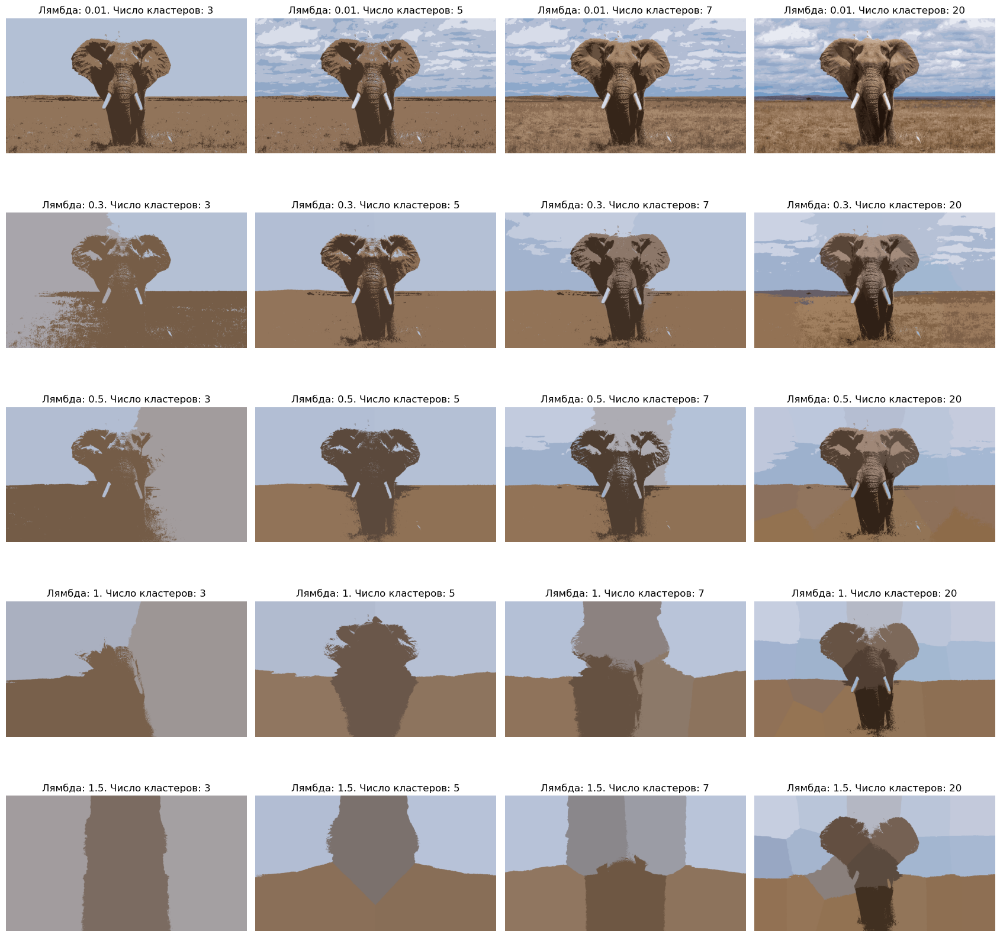

In [33]:
lmbd_values = [0.01, 0.3, 0.5, 1, 1.5]
n_clusters = [3, 5, 7, 20]

plt.figure(figsize=(17, 17))

s = 1
for lmbd in lmbd_values:
    for n in n_clusters:
        segmented_img = find_components(animal, lmbd, n)

        plt.subplot(len(lmbd_values), len(n_clusters), s)
        plt.imshow(segmented_img)
        plt.title(f"Лямбда: {lmbd}. Число кластеров: {n}")
        plt.axis("off")

        s += 1


plt.tight_layout()
plt.show()

In [39]:
from skimage import color, transform
from sklearn.cluster import spectral_clustering
from sklearn.feature_extraction.image import img_to_graph


def spectral_segmentation(image, n_clusters, beta, eps):
    #your code here
    gray_image = color.rgb2gray(image)
    resized_image = transform.resize(gray_image, (gray_image.shape[0] // 2, gray_image.shape[1] // 2))

    graph = img_to_graph(resized_image)
    graph.data = np.exp(-beta * graph.data / resized_image.std()) + eps

    labels = spectral_clustering(
        graph,
        n_clusters=n_clusters,
        assign_labels="kmeans",
    )

    labels = labels.reshape(resized_image.shape)

    return labels, resized_image

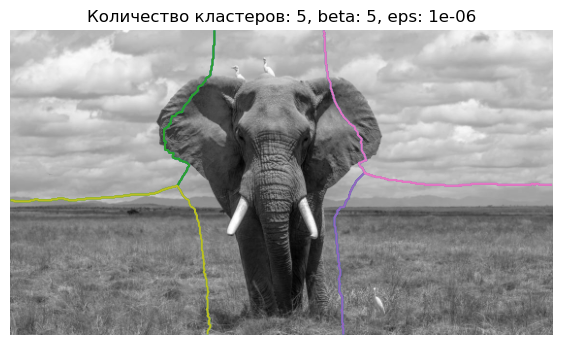

In [41]:
img = animal
n_clusters = 5
beta = 5 
eps = 1e-6


labels, resized_image = spectral_segmentation(img, n_clusters, beta, eps)

plt.figure(figsize=(7, 7))
plt.imshow(resized_image, cmap=plt.cm.gray)

for l in range(n_clusters):
    plt.contour(labels == l, colors=[plt.cm.tab10(l / float(n_clusters)),])

plt.title(f"Количество кластеров: {n_clusters}, beta: {beta}, eps: {eps}")
plt.axis("off")
plt.show()

**Ваш ответ здесь**

KMeans показал себя как хорошию отправную точку из-за его простоты и скорости.
Сегменты KMeans выглядят “шумными” и не соответствуют ожидаемым объектам. Если увеличивать значимость координат, то сегментация проводится путём разделения плоскости на примерно равные кластеры.

Спектральная кластеризация хорошо справляется с кластерами сложной формы, которые KMeans не может обнаружить. Спектральная кластеризация ощутимо вычислительно затратнее, чем KMeans.

## **Бонус (1 балл)**

В качестве бонуса предлагаем вам построить алгоритм кластеризации типов движения на наборе Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 1 (0.05 балла)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [ ]:
# Ваш код здесь
X =
y =

In [ ]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

### **Задание 2 (0.05 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [ ]:
# Ваш код здесь
scaler =
X_scaled =

### **Задание 3 (0.15 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мспользуем методы **понижения размерности**. В частности, мы будем использовать метод главных компонент. Если вы проходили степик, то знакомы с ним, если нет, то почитать про PCA вам нужно в [Конспекте](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture12-factorizations.pdf).

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма массива pca.explained_variance_ratio_ должна быть больше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [ ]:
# Ваш код здесь
plt.scatter()

### **Задание 4. (0.15 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [ ]:
# Ваш код здесь

### **Задание 6 (0.05 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

In [ ]:
# Ваш код здесь

### **Задание 7 (0.1 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 8 (0.15 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 9 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Ваш ответ здесь.**

**Вы ещё здесь!** или **уже**?)

Спасибо за труд! Котобонус:

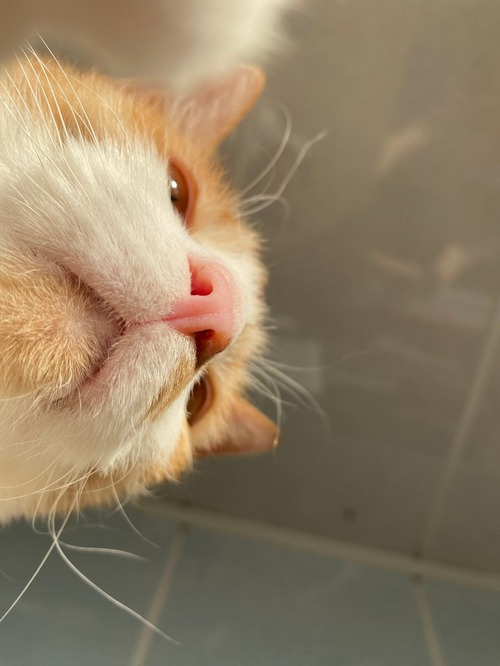